# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.

<details><summary>Traduccion</summary>

### Objetivo
En este cuaderno, vas a crear tu primera red generativa adversarial (GAN) para este curso. Específicamente, construirás y entrenarás una GAN que pueda generar imágenes manuscritas de dígitos (0-9). Utilizarás PyTorch en esta especialización, así que si no estás familiarizado con este framework, puede que encuentres útil la [documentación de PyTorch](https://pytorch.org/docs/stable/index.html). Las pistas también incluirán a menudo enlaces a la documentación pertinente.

### Objetivos de aprendizaje
1.   Construir los componentes generador y discriminador de un GAN desde cero.
2.   2. Crear funciones de pérdida del generador y del discriminador.
3.   Entrene su GAN y visualice las imágenes generadas.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.  

<br>
<details><summary>Traduccion</summary>

## Cómo empezar
Comenzará importando algunos paquetes útiles y el conjunto de datos que utilizará para construir y entrenar su GAN. También se le proporciona una función de visualización para ayudarle a investigar las imágenes que su GAN creará.

In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    Función de visualización de imágenes: Dado un tensor de imágenes, número de imágenes y
    tamaño por imagen, traza e imprime las imágenes en una cuadrícula uniforme.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).


<br>
<details><summary>Traduccion</summary>

Las imágenes de entrenamiento que utilizará su discriminador proceden de un conjunto de datos llamado [MNIST](http://yann.lecun.com/exdb/mnist/). Contiene 60.000 imágenes de dígitos escritos a mano, del 0 al 9, como éstas:

[MNIST Digits](MnistExamples.png)

Puede notar que las imágenes están bastante pixeladas -- ¡esto se debe a que todas tienen sólo 28 x 28! El pequeño tamaño de sus imágenes hace que MNIST sea ideal para un entrenamiento sencillo. Además, estas imágenes también están en blanco y negro, por lo que sólo se necesita una dimensión, o "canal de color", para representarlas (se hablará de esto más adelante en el curso).
 
</details>
       
#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

<br>
<details><summary>Traduccion</summary>

#### Tensor
Representarás los datos utilizando [tensores](https://pytorch.org/docs/stable/tensors.html). Los tensores son una generalización de las matrices: por ejemplo, una pila de tres matrices con las cantidades de rojo, verde y azul en diferentes lugares de una imagen de 64 x 64 píxeles es un tensor con la forma 3 x 64 x 64.

Los tensores son fáciles de manipular y están soportados por [PyTorch](https://pytorch.org/), la biblioteca de aprendizaje automático que vas a utilizar. Siéntete libre de explorarlos más, pero puedes imaginarlos como matrices o vectores multidimensionales.

</details>
    
    
#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

<br><details><summary>Traduccion</summary>

Aunque podría entrenar su modelo después de generar una imagen, es extremadamente ineficiente y conduce a un entrenamiento menos estable. En los GAN, y en el aprendizaje automático en general, se procesan varias imágenes por paso de entrenamiento. Estas se denominan lotes.

Esto significa que su generador generará un lote completo de imágenes y recibirá la retroalimentación del discriminador en cada una de ellas antes de actualizar el modelo. Lo mismo ocurre con el discriminador, que calculará su pérdida en todo el lote de imágenes generadas, así como en las reales, antes de actualizar el modelo.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

<br>
<details><summary>Traduccion</summary>

El primer paso es construir el componente generador.

Empezarás creando una función para hacer una sola capa/bloque para la red neuronal del generador. Cada bloque debe incluir una [transformación lineal](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) para mapear a otra forma, una [normalización por lotes](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) para la estabilización, y finalmente una función de activación no lineal (se utiliza un [ReLU aquí](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) para que la salida pueda ser transformada en formas complejas. Aprenderás más sobre las activaciones y la normalización por lotes más adelante en el curso.

In [3]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim:  the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [4]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.


<br>
<details><summary>Traduccion</summary>

Ahora puedes construir la clase generadora. Tomará 3 valores:

* La dimensión del vector de ruido
* La dimensión de la imagen
* La dimensión oculta inicial

Usando estos valores, el generador construirá una red neuronal con 5 capas/bloques. Comenzando con el vector de ruido, el generador aplicará transformaciones no lineales a través de la función de bloque hasta que el tensor se mapee al tamaño de la imagen que se va a emitir (el mismo tamaño que las imágenes reales de MNIST). Tendrá que rellenar el código de la capa final ya que es diferente a las demás. La capa final no necesita una función de normalización o activación, pero sí necesita ser escalada con una [función sigmoide](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Por último, se le da una función de paso hacia adelante que toma un vector de ruido y genera una imagen de la dimensión de salida utilizando su red neuronal.
</details>

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [5]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [6]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<br>
<details><summary>Traduccion</summary>

Para poder utilizar su generador, tendrá que ser capaz de crear vectores de ruido. El vector de ruido z tiene el importante papel de asegurar que las imágenes generadas a partir de la misma clase no tengan todas el mismo aspecto -- piensa en él como una semilla aleatoria. Se generará aleatoriamente utilizando PyTorch mediante el muestreo de números aleatorios de la distribución normal. Como se procesarán múltiples imágenes por pase, generarás todos los vectores de ruido a la vez.

Tenga en cuenta que siempre que cree un nuevo tensor usando torch.ones, torch.zeros, o torch.randn, debe crearlo en el dispositivo de destino, por ejemplo `torch.ones(3, 3, device=device)`, o moverlo al dispositivo de destino usando `torch.ones(3, 3).to(device)`. No es necesario que hagas esto si estás creando un tensor manipulando otro tensor o utilizando una variación que defina por defecto el dispositivo de entrada, como `torch.ones_like`. En general, utilice `torch.ones_like` y `torch.zeros_like` en lugar de `torch.ones` o `torch.zeros` cuando sea posible.


</details>

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [7]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [8]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


Rectified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
[ReLU](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  [Leaky ReLU](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)


<br>
<details><summary>Traduccion</summary>

El segundo componente que hay que construir es el discriminador. Al igual que con el componente generador, empezarás creando una función que construya un bloque de red neuronal para el discriminador.

*Nota: Se utilizan leaky ReLUs  para evitar el problema de la "ReLU moribunda", que se refiere al fenómeno en el que los parámetros dejan de cambiar debido a los valores negativos que se pasan a una ReLU, lo que resulta en un gradiente cero. Aprenderás más sobre esto en las siguientes clases.*


Rectified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
[ReLU](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  [Leaky ReLU](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)


In [9]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [10]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


<br>
<details><summary>Traduccion</summary>

Ahora puedes usar estos bloques para hacer un discriminador. La clase discriminador contiene 2 valores:

* La dimensión de la imagen
* La dimensión oculta

El discriminador construirá una red neuronal con 4 capas. Comenzará con el tensor de la imagen y lo transformará hasta que devuelva un único número (tensor de 1 dimensión) de salida. Esta salida clasifica si una imagen es falsa o real. Tenga en cuenta que no necesita un sigmoide después de la capa de salida, ya que está incluido en la función de pérdida. Por último, para utilizar la red neuronal de su discriminador se le da una función de paso hacia adelante que toma un tensor de imagen para ser clasificado.


In [13]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [14]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.

<br>
<details><summary>Traduccion</summary>

Ahora puedes ponerlo todo junto.
En primer lugar, establecerá sus parámetros:
  * criterio: la función de pérdida
  * n_epocos: el número de veces que se itera a través del conjunto de datos cuando se entrena
  * z_dim: la dimensión del vector de ruido
  * Paso_de_visualización: la frecuencia con la que se muestran/visualizan las imágenes
  * batch_size: el número de imágenes por pase hacia adelante/hacia atrás
  * lr: la tasa de aprendizaje
  * dispositivo: el tipo de dispositivo, aquí se utiliza una GPU (que ejecuta CUDA), no la CPU

A continuación, cargaremos el conjunto de datos MNIST como tensores utilizando un cargador de datos.



In [15]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

<br>
<details><summary>Traduccion</summary>

Ahora, puede inicializar su generador, discriminador y optimizadores. Tenga en cuenta que cada optimizador sólo toma los parámetros de un modelo en particular, ya que queremos que cada optimizador optimice sólo uno de los modelos.

In [16]:
gen      = Generator(z_dim).to(device)
gen_opt  = torch.optim.Adam(gen.parameters(), lr=lr)
disc     = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

<br>
<details><summary>Traduccion</summary>


Antes de entrenar su GAN, tendrá que crear funciones para calcular la pérdida del discriminador y la pérdida del generador. Así es como el discriminador y el generador sabrán cómo lo están haciendo y se mejorarán a sí mismos. Dado que el generador es necesario cuando se calcula la pérdida del discriminador, tendrá que llamar a .detach() en el resultado del generador para asegurarse de que sólo se actualiza el discriminador.

Recuerde que ya ha definido una función de pérdida anteriormente (`criterio`) y se le anima a utilizar `torch.ones_like` y `torch.zeros_like` en lugar de `torch.ones` o `torch.zeros`. Si usas `torch.ones` o `torch.zeros`, tendrás que pasarles `device=device`.

In [25]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    
    # Estos son los pasos que tendrá que completar:
    #     1) Crear vectores de ruido y generar un lote (num_images) de imágenes falsas. 
    #            Asegúrese de pasar el argumento del dispositivo al ruido.
    #     2) Obtener la predicción del discriminador de la imagen falsa 
    #         y calcula la pérdida. No olvides separar el generador.
    #        (Recuerda la función de pérdida que estableciste antes -- criterio. Necesitas un 
    #        un tensor de "verdad básica" para poder calcular la pérdida. 
    #        Por ejemplo, un tensor de verdad para una imagen falsa es todo ceros).
    #     3) Obtenga la predicción del discriminador de la imagen real y calcule la pérdida.
    #     4) Calcular la pérdida del discriminador promediando la pérdida real y la falsa
    #         y establecerla como disc_loss.
    # *Importante*: NO debe escribir su propia función de pérdida aquí - ¡utilice criterion(pred, true)!
    #### START CODE HERE ####
    ruido_falso            = get_noise(num_images, z_dim, device = device)
    
    pred_img_falsa         = gen(ruido_falso)
    
    disc_img_falsa         = disc(pred_img_falsa.detach())
    perdida_desc_img_falsa = criterion(disc_img_falsa ,  torch.zeros_like(disc_img_falsa))
    
    disc_img_real          = disc(real)
    perdida_desc_img_real  = criterion(disc_img_real ,  torch.ones_like(disc_img_real))
    
    disc_loss              = (perdida_desc_img_falsa + perdida_desc_img_real) / 2
    #### END CODE HERE ####
    return disc_loss

In [26]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [31]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    
    # Estos son los pasos que deberá completar:
    # 1) Crear vectores de ruido y generar un lote de imágenes falsas. 
    #    Recuerda pasar el argumento del dispositivo a la función get_noise.
    # 2) Obtener la predicción del discriminador de la imagen falsa.
    # 3) Calcular la pérdida del generador. Recuerda que el generador quiere
    #    que el discriminador piense que sus imágenes falsas son reales
    # *Importante*: NO debe escribir su propia función de pérdida aquí - ¡utilice criterion(pred, true)!


    #### START CODE HERE ####
    ruido_falso     = get_noise(num_images, z_dim, device = device)
    img_falsa       = gen(ruido_falso)
    disc_img_falsa  = disc(img_falsa)
    gen_loss        = criterion(disc_img_falsa, torch.ones_like(disc_img_falsa))
    #### END CODE HERE ####
    return gen_loss

In [32]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

<br>
<details><summary>Traduccion</summary>

Finalmente, ¡puedes juntar todo! Para cada época, procesará el conjunto de datos en lotes. Para cada lote, tendrá que actualizar el discriminador y el generador utilizando su pérdida. Los lotes son conjuntos de imágenes que se predecirán antes de calcular las funciones de pérdida (en lugar de calcular la función de pérdida después de cada imagen). Tenga en cuenta que puede ver que la pérdida es mayor que 1, esto está bien ya que la pérdida de entropía cruzada binaria puede ser cualquier número positivo para una conjetura errónea suficientemente segura. 

También es frecuente que el discriminador supere al generador, especialmente al principio, porque su trabajo es más fácil. Es importante que ninguno de los dos sea demasiado bueno (es decir, que tenga una precisión casi perfecta), lo que haría que todo el modelo dejara de aprender. Equilibrar los dos modelos es realmente muy difícil de hacer en un GAN estándar y algo que verás más en las clases y tareas posteriores.

Después de haber entregado una versión de trabajo con la arquitectura original, siéntase libre de jugar con la arquitectura si desea ver cómo las diferentes opciones de arquitectura pueden conducir a mejores o peores GANs. Por ejemplo, considere la posibilidad de cambiar el tamaño de la dimensión oculta, o hacer que las redes sean más superficiales o más profundas cambiando el número de capas.

<!-- Además, se advierte que esto se ejecuta muy lentamente en una CPU. Una forma de ejecutarlo más rápidamente es utilizar Google Colab: 

1.   Descargue el .ipynb
2.   Súbelo a Google Drive y ábrelo con Google Colab
3.   Haz que el tipo de ejecución sea GPU (en "Runtime" -> "Change runtime type" -> Selecciona "GPU" en el desplegable)
4.   Sustituye `device = "cpu"` por `device = "cuda"`.
5.   Asegúrese de que su función `get_noise` utiliza el dispositivo correcto -->
    
Pero recuerda, no esperes nada espectacular: ésta es sólo la primera lección. Los resultados mejorarán con las lecciones posteriores a medida que aprendas métodos que te ayuden a mantener tu generador y tu discriminador en niveles similares.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

<br>
<details><summary>Traduccion</summary>


A grandes rasgos, deberías esperar ver esta progresión. En una GPU, esto debería tardar unos 15 segundos por cada 500 pasos, de media, mientras que en la CPU tardará aproximadamente 1,5 minutos:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

Step 500: Generator loss: 1.3956087362766267, discriminator loss: 0.43574618303775803


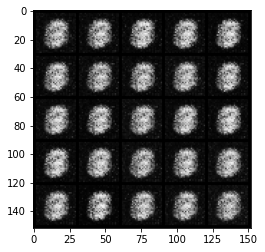

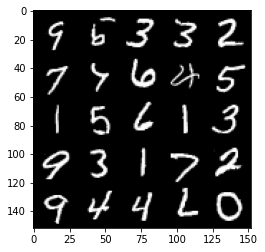

Step 1000: Generator loss: 1.7358235282897951, discriminator loss: 0.28991260224580734


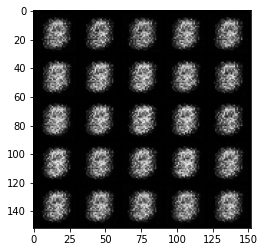

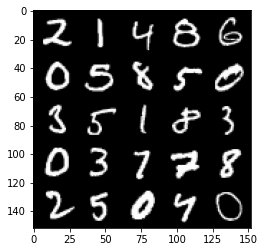

Step 1500: Generator loss: 2.0211966314315792, discriminator loss: 0.1756023100912571


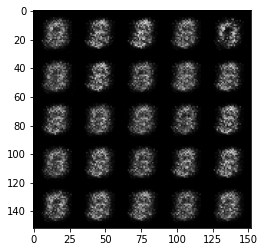

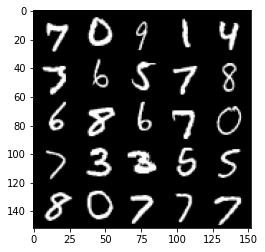

Step 2000: Generator loss: 1.731676237583161, discriminator loss: 0.20483592650294308


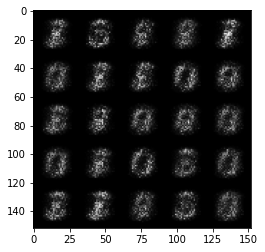

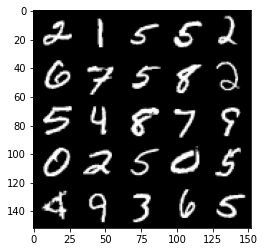

Step 2500: Generator loss: 1.6638249046802527, discriminator loss: 0.2095500406026839


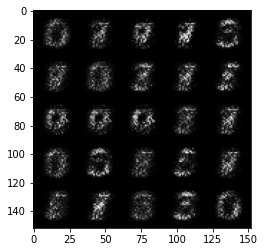

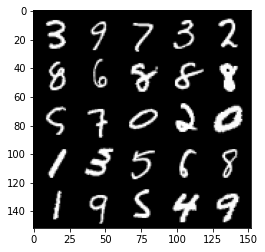

Step 3000: Generator loss: 1.9852588260173802, discriminator loss: 0.15762758025527013


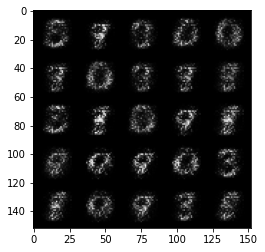

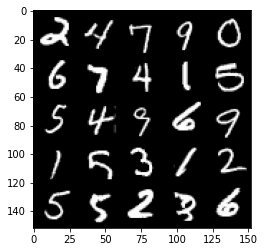

Step 3500: Generator loss: 2.3151657843589777, discriminator loss: 0.12906052801012996


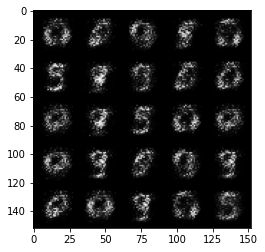

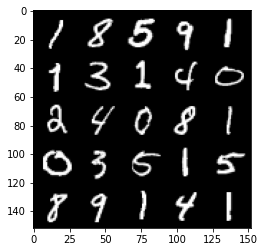

Step 4000: Generator loss: 2.771387141227722, discriminator loss: 0.10292424120008944


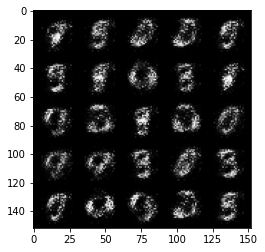

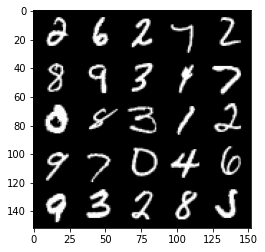

Step 4500: Generator loss: 3.1150542216300963, discriminator loss: 0.09547945645451553


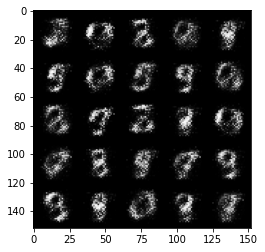

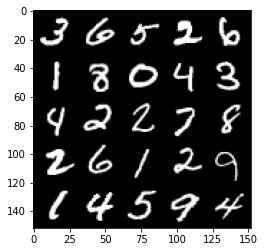

Step 5000: Generator loss: 3.2891953854560847, discriminator loss: 0.0887932916283608


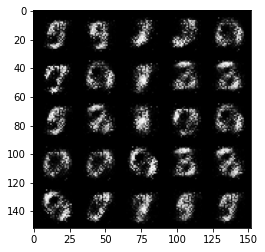

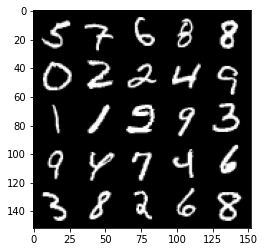

Step 5500: Generator loss: 3.6186884431838986, discriminator loss: 0.06831721907109027


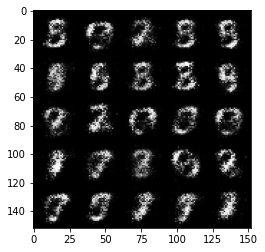

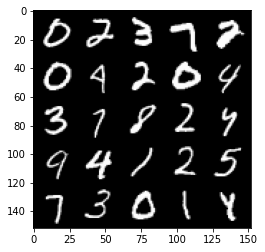

Step 6000: Generator loss: 3.9788944692611703, discriminator loss: 0.05454763791710134


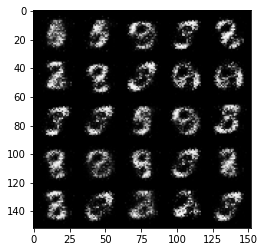

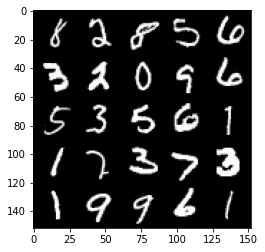

Step 6500: Generator loss: 3.9031630010604856, discriminator loss: 0.0616280386298895


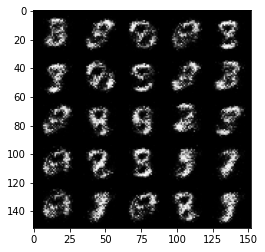

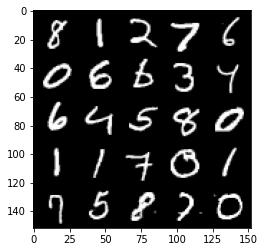

Step 7000: Generator loss: 3.9230496888160715, discriminator loss: 0.06023505667597058


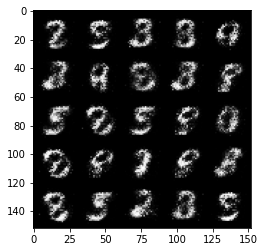

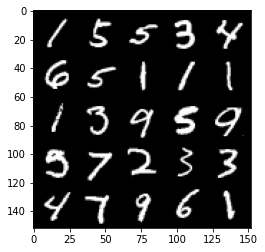

Step 7500: Generator loss: 4.038269647598266, discriminator loss: 0.051776691347360654


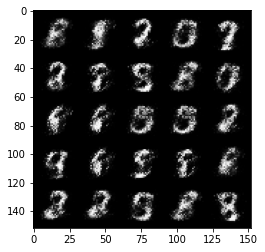

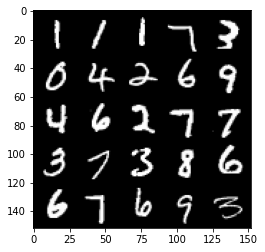

Step 8000: Generator loss: 4.282487545013426, discriminator loss: 0.04668217075988653


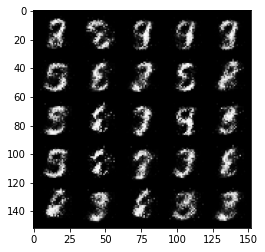

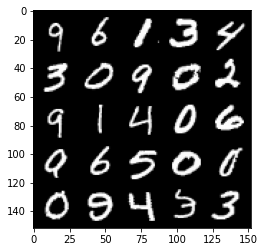

Step 8500: Generator loss: 4.160481672286985, discriminator loss: 0.052959155675023795


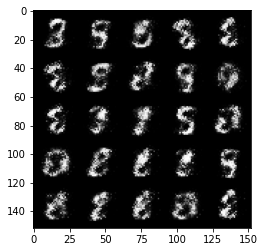

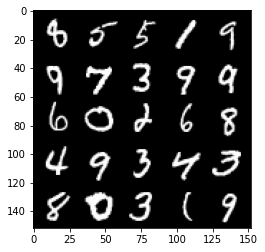

Step 9000: Generator loss: 4.137242421627047, discriminator loss: 0.06059459896385667


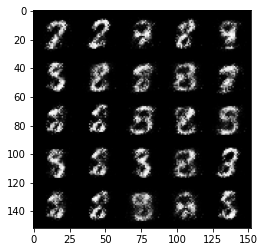

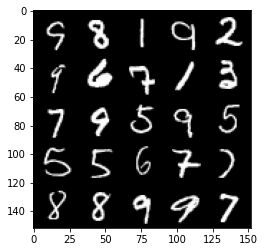

Step 9500: Generator loss: 3.9691116099357613, discriminator loss: 0.0711006544679404


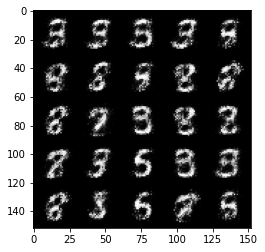

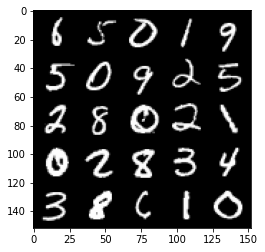

Step 10000: Generator loss: 4.180490835666661, discriminator loss: 0.06729341226443648


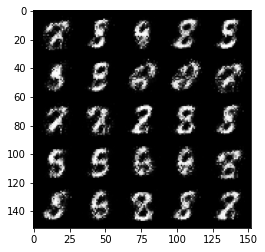

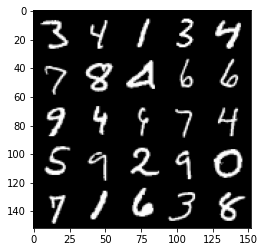

Step 10500: Generator loss: 4.157208203792575, discriminator loss: 0.0665724234282971


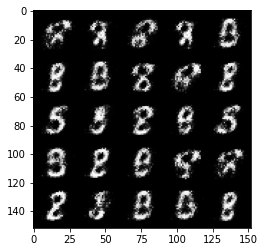

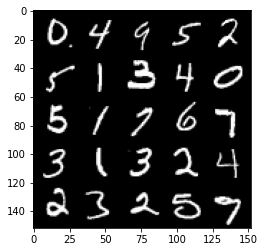

Step 11000: Generator loss: 4.162658163070682, discriminator loss: 0.06599330672249196


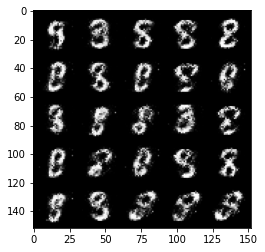

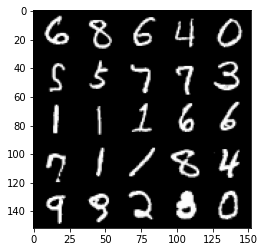

Step 11500: Generator loss: 3.9881923885345447, discriminator loss: 0.07650282613933088


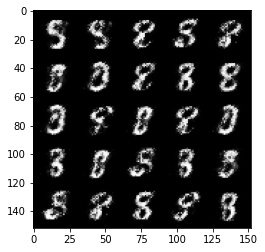

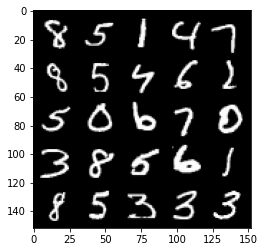

Step 12000: Generator loss: 3.826238836288449, discriminator loss: 0.07767615669965733


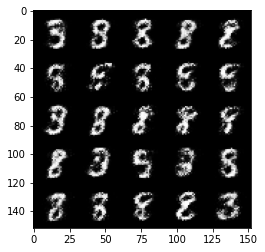

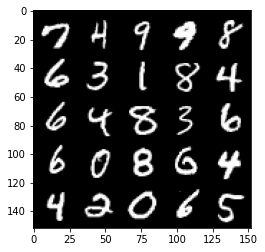

Step 12500: Generator loss: 3.9543692574501037, discriminator loss: 0.08518139500916004


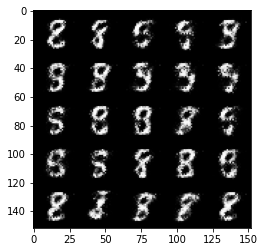

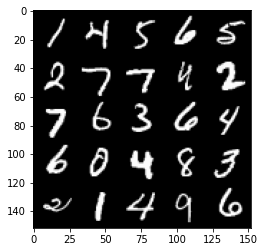

Step 13000: Generator loss: 3.8637576999664334, discriminator loss: 0.08917760249227277


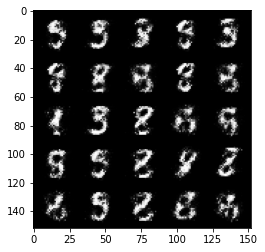

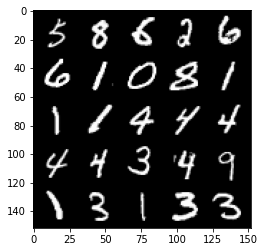

Step 13500: Generator loss: 3.9922485337257365, discriminator loss: 0.0864276949167252


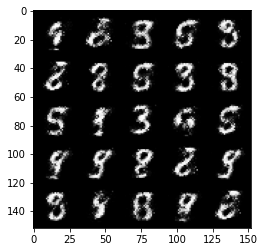

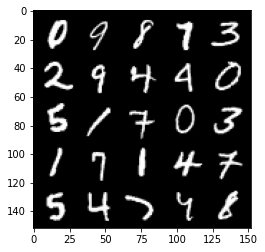

Step 14000: Generator loss: 3.9838767166137736, discriminator loss: 0.09268777401000267


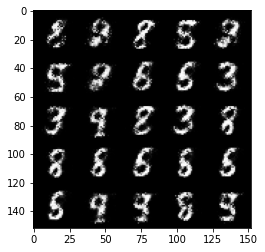

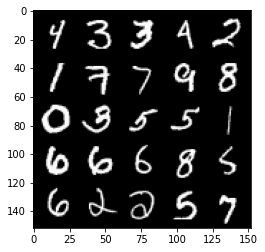

Step 14500: Generator loss: 3.7309086647033713, discriminator loss: 0.09718924584984771


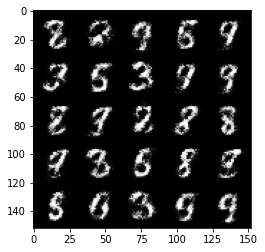

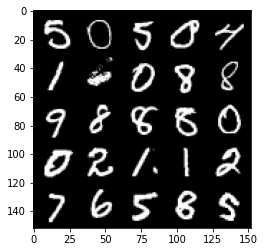

Step 15000: Generator loss: 3.8518524699211123, discriminator loss: 0.09022905395180005


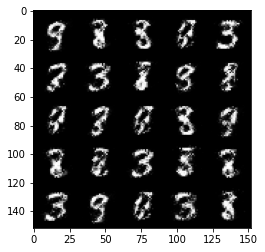

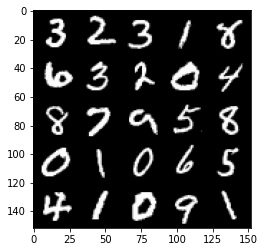

Step 15500: Generator loss: 3.7743804669380165, discriminator loss: 0.09954685545712712


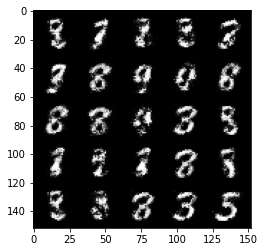

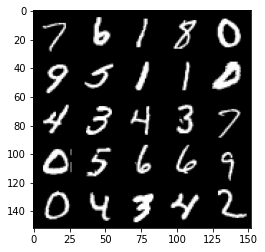

Step 16000: Generator loss: 3.7108220710754436, discriminator loss: 0.10369268634170288


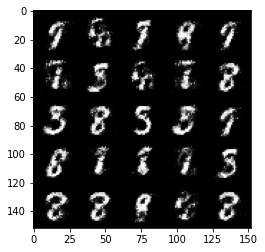

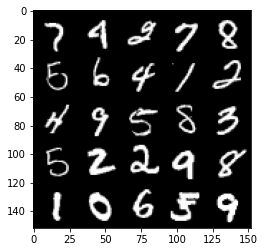

Step 16500: Generator loss: 3.81001989984512, discriminator loss: 0.1053057070150972


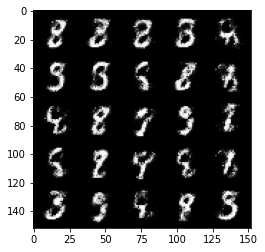

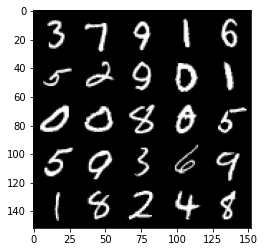

Step 17000: Generator loss: 3.798294483184813, discriminator loss: 0.11011885124444967


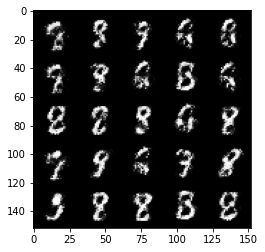

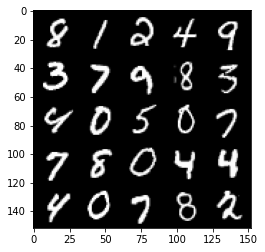

Step 17500: Generator loss: 3.663198987483981, discriminator loss: 0.1149843272939323


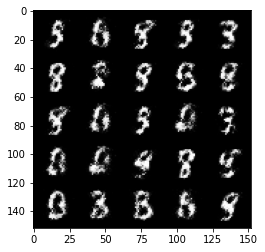

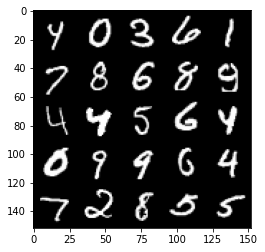

Step 18000: Generator loss: 3.6161644287109356, discriminator loss: 0.12993443232774732


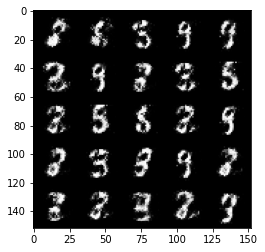

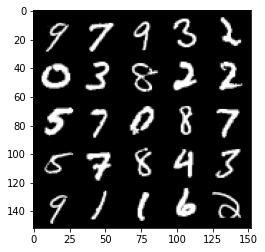

Step 18500: Generator loss: 3.5609630508422856, discriminator loss: 0.11422390727698793


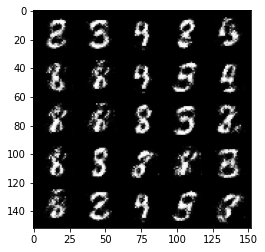

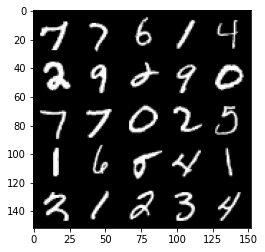

Step 19000: Generator loss: 3.495954505920407, discriminator loss: 0.12649390348792086


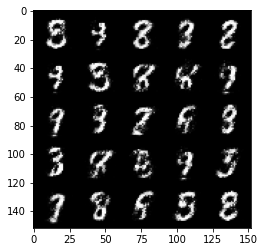

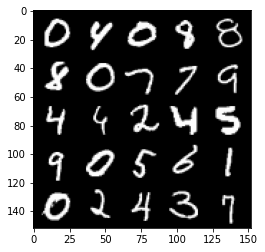

Step 19500: Generator loss: 3.5030312948226947, discriminator loss: 0.1184017751440405


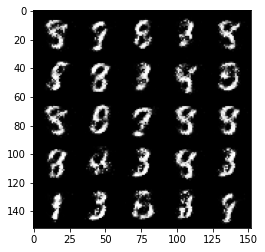

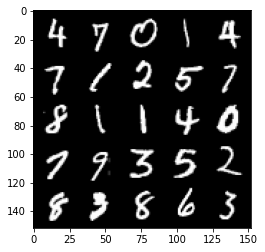

Step 20000: Generator loss: 3.5004145855903634, discriminator loss: 0.13031886435300116


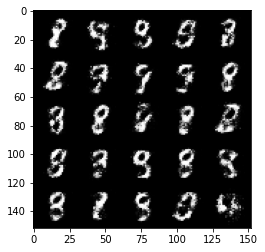

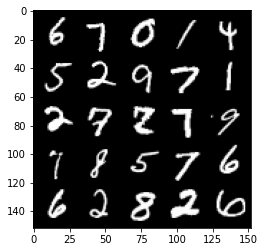

Step 20500: Generator loss: 3.3126985344886752, discriminator loss: 0.15235494698584062


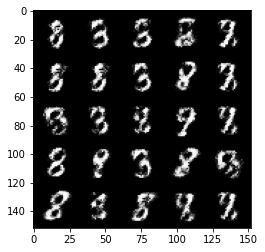

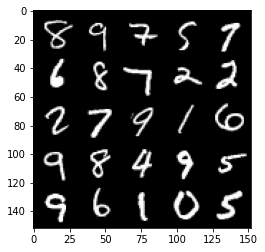

Step 21000: Generator loss: 3.298844106674192, discriminator loss: 0.14514584241807446


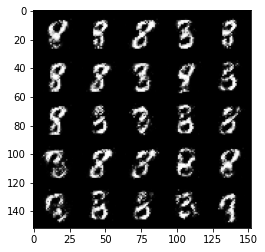

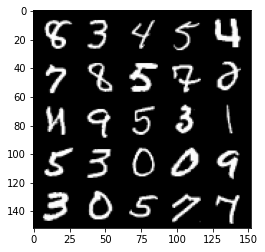

Step 21500: Generator loss: 3.4432456078529383, discriminator loss: 0.13816112605482334


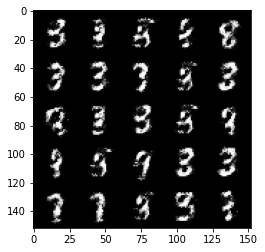

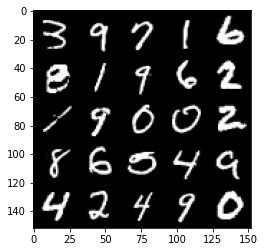

Step 22000: Generator loss: 3.3958643088340787, discriminator loss: 0.14236201693117637


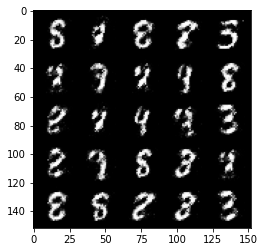

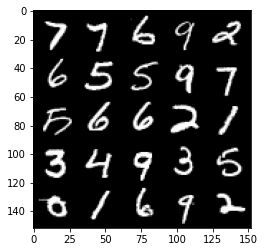

Step 22500: Generator loss: 3.209305067539217, discriminator loss: 0.15395690019428732


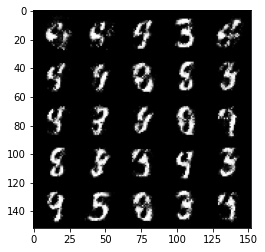

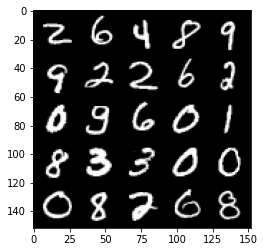

Step 23000: Generator loss: 3.26077591943741, discriminator loss: 0.14743305498361586


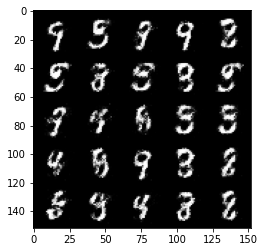

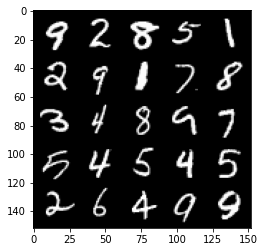

Step 23500: Generator loss: 3.3834892125129694, discriminator loss: 0.14764760328084248


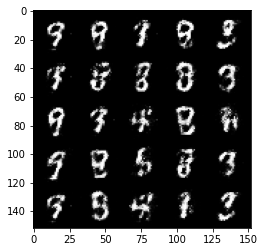

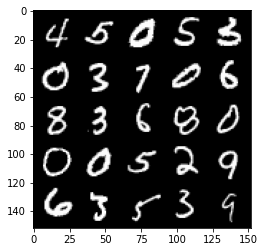

Step 24000: Generator loss: 3.289731257915493, discriminator loss: 0.15189759807288658


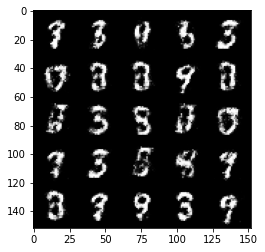

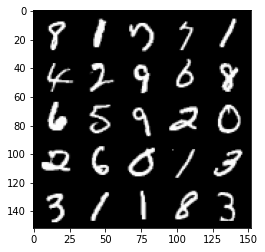

Step 24500: Generator loss: 3.1509421620368965, discriminator loss: 0.16373264756798736


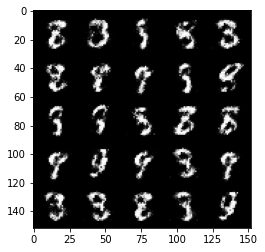

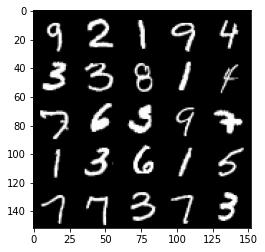

Step 25000: Generator loss: 3.2270456414222726, discriminator loss: 0.16162542735040175


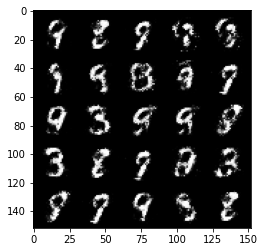

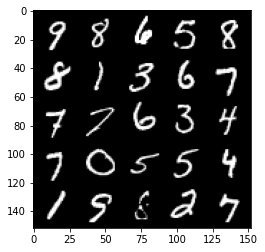

Step 25500: Generator loss: 3.3809630107879634, discriminator loss: 0.14355574639141547


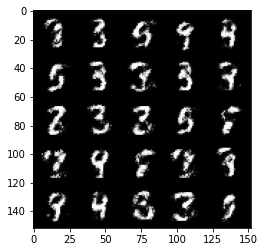

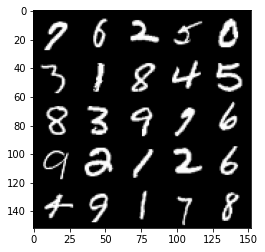

Step 26000: Generator loss: 3.3360155382156367, discriminator loss: 0.14820025865733627


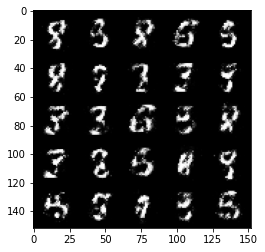

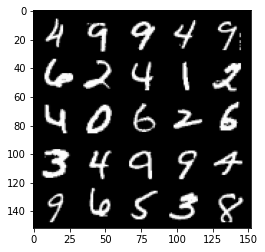

Step 26500: Generator loss: 3.1410463485717792, discriminator loss: 0.16735854524374008


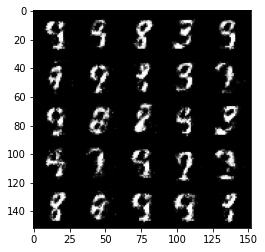

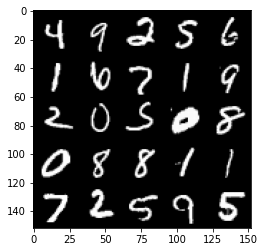

Step 27000: Generator loss: 3.202767794132232, discriminator loss: 0.16495238977670665


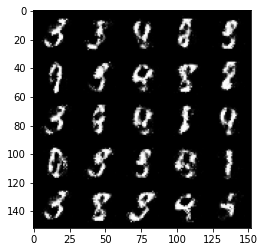

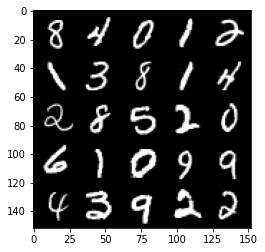

Step 27500: Generator loss: 3.1028661284446706, discriminator loss: 0.17525764472782607


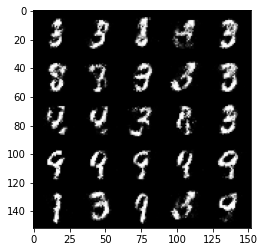

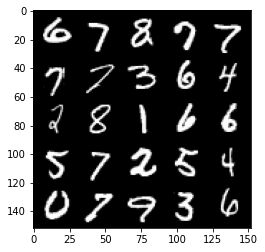

Step 28000: Generator loss: 3.1056579179763824, discriminator loss: 0.17945113685727113


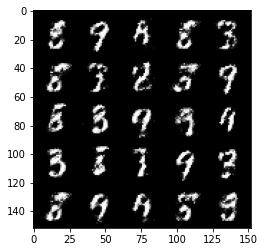

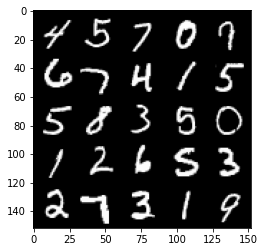

Step 28500: Generator loss: 3.1236035122871404, discriminator loss: 0.18294600570201874


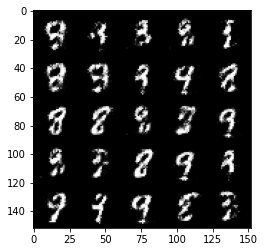

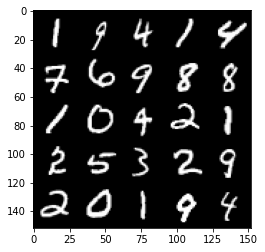

Step 29000: Generator loss: 2.840680786132812, discriminator loss: 0.20062439621984945


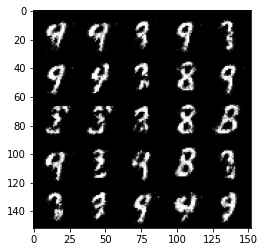

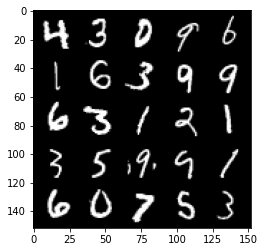

Step 29500: Generator loss: 2.8972931771278367, discriminator loss: 0.19099259993433923


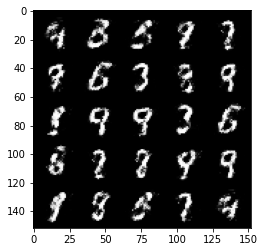

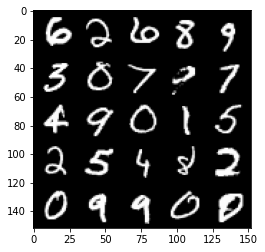

Step 30000: Generator loss: 2.9950803122520475, discriminator loss: 0.1752218776792288


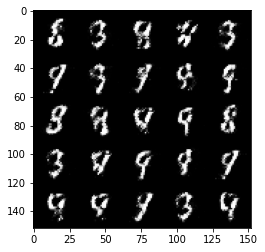

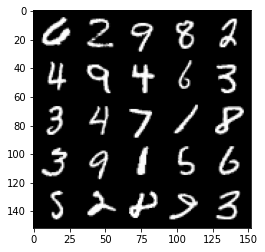

Step 30500: Generator loss: 2.776438447475434, discriminator loss: 0.2142617115080358


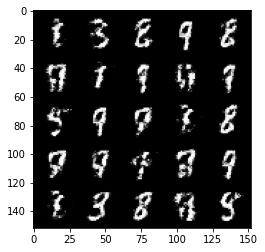

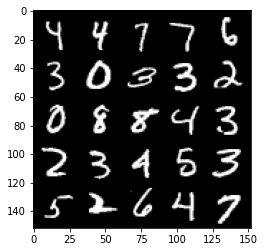

Step 31000: Generator loss: 2.8818151702880836, discriminator loss: 0.2004408032894133


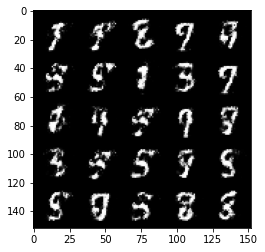

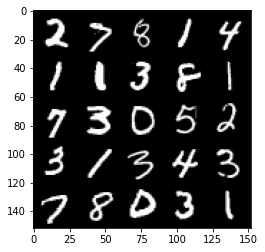

Step 31500: Generator loss: 2.89743861627579, discriminator loss: 0.19882083815336216


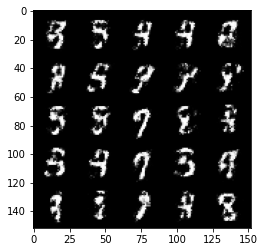

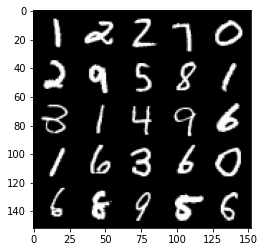

Step 32000: Generator loss: 2.8208758416175836, discriminator loss: 0.21036638587713238


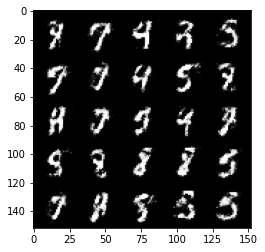

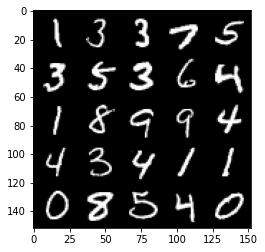

Step 32500: Generator loss: 2.7175204682350182, discriminator loss: 0.2031411971747873


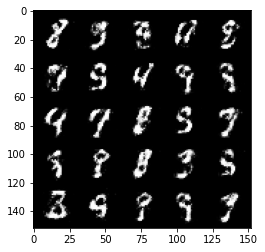

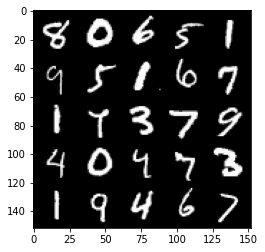

Step 33000: Generator loss: 2.78947565317154, discriminator loss: 0.21343611247837546


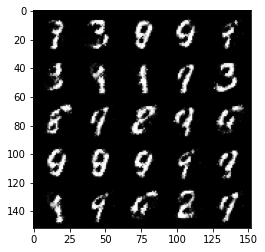

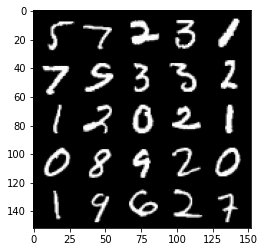

Step 33500: Generator loss: 2.715380843162535, discriminator loss: 0.2237144454121588


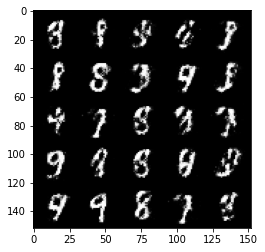

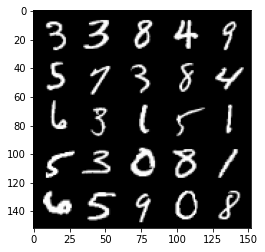

Step 34000: Generator loss: 2.64441176223755, discriminator loss: 0.23039040884375592


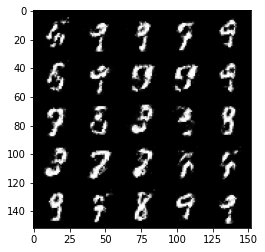

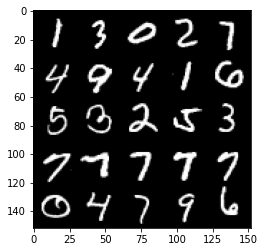

Step 34500: Generator loss: 2.846584583282466, discriminator loss: 0.19307829023897652


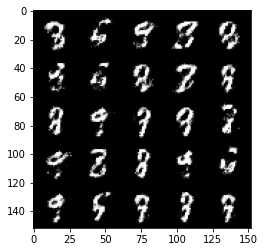

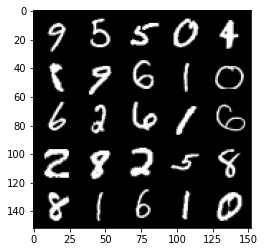

Step 35000: Generator loss: 2.7332722191810603, discriminator loss: 0.2130945646613838


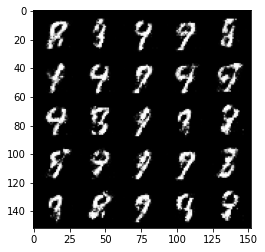

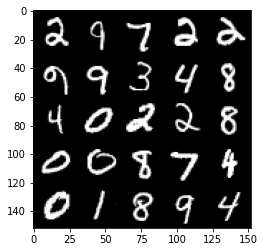

Step 35500: Generator loss: 2.6133570466041576, discriminator loss: 0.23548721885681143


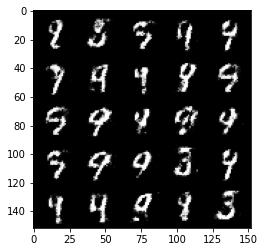

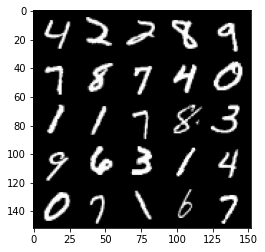

Step 36000: Generator loss: 2.70332423067093, discriminator loss: 0.198175264686346


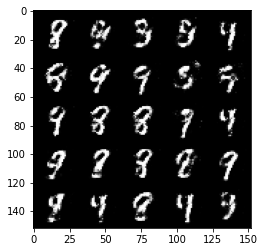

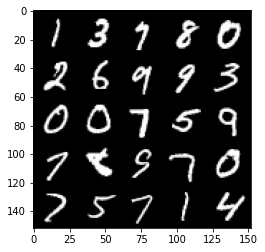

Step 36500: Generator loss: 2.7776639671325682, discriminator loss: 0.20240657505393042


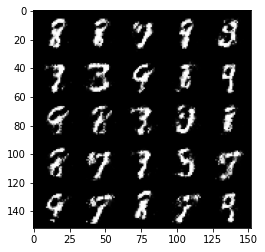

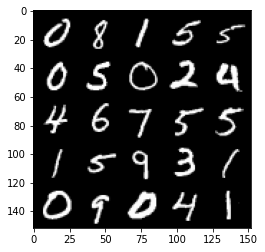

Step 37000: Generator loss: 2.5985373823642743, discriminator loss: 0.22607054555416098


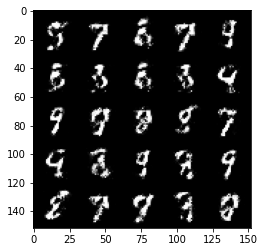

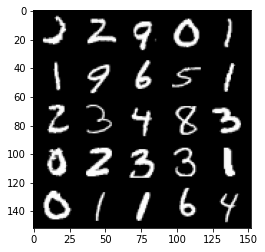

Step 37500: Generator loss: 2.6237683606147764, discriminator loss: 0.22430539599061008


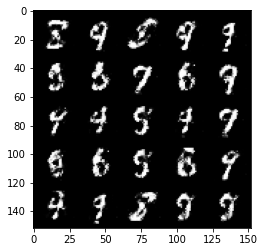

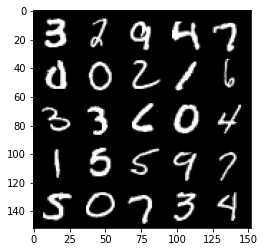

Step 38000: Generator loss: 2.558843968153002, discriminator loss: 0.243679510951042


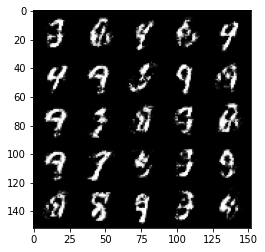

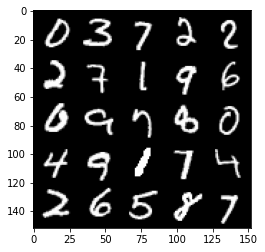

Step 38500: Generator loss: 2.5085610280036934, discriminator loss: 0.23339026135206248


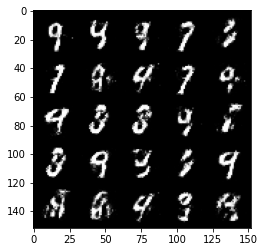

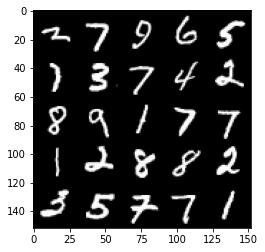

Step 39000: Generator loss: 2.5513046164512647, discriminator loss: 0.23842692947387722


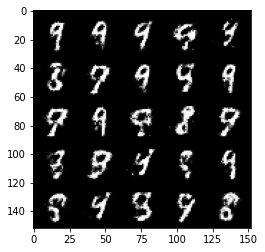

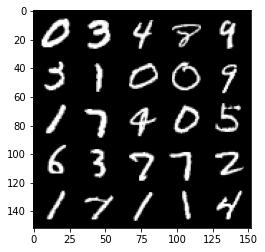

Step 39500: Generator loss: 2.599456161022186, discriminator loss: 0.23136407151818256


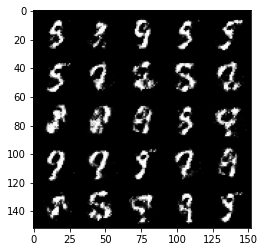

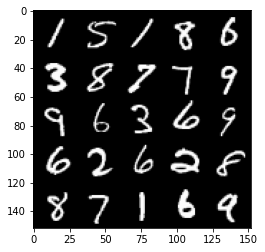

Step 40000: Generator loss: 2.4348257241249103, discriminator loss: 0.24579030030965807


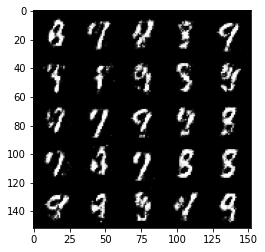

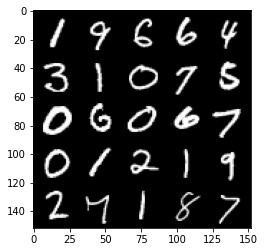

Step 40500: Generator loss: 2.456412232875824, discriminator loss: 0.2541878825128078


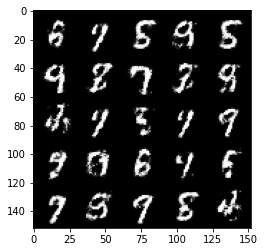

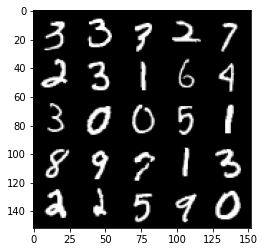

Step 41000: Generator loss: 2.4747071688175173, discriminator loss: 0.2480085645318031


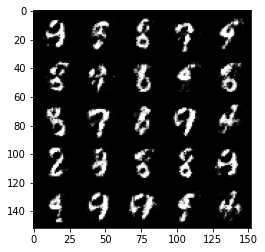

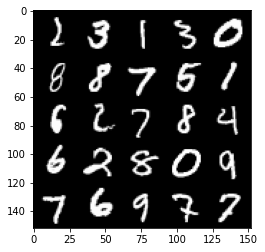

Step 41500: Generator loss: 2.2607565846443176, discriminator loss: 0.2878042255043985


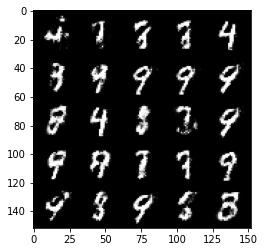

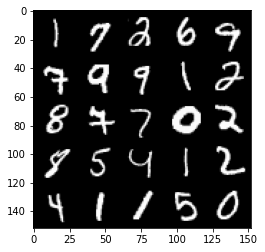

Step 42000: Generator loss: 2.1919161844253554, discriminator loss: 0.28789231696724865


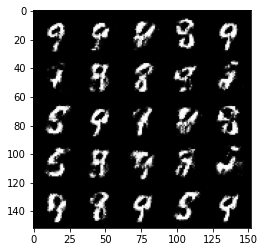

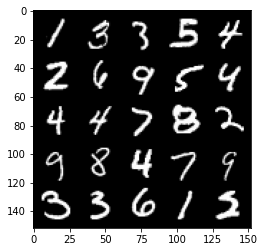

Step 42500: Generator loss: 2.2879006621837616, discriminator loss: 0.2705857487916946


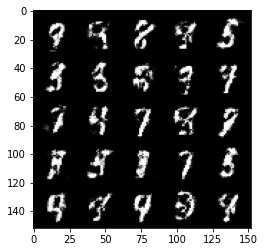

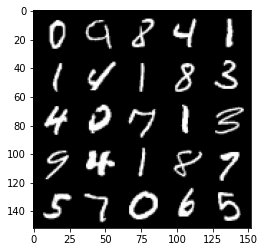

Step 43000: Generator loss: 2.3073648679256435, discriminator loss: 0.26708088850975054


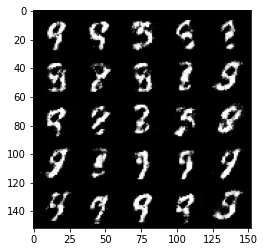

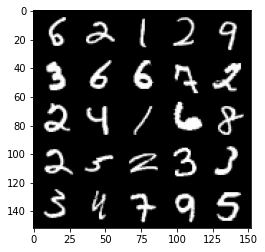

Step 43500: Generator loss: 2.20025543856621, discriminator loss: 0.30387512758374213


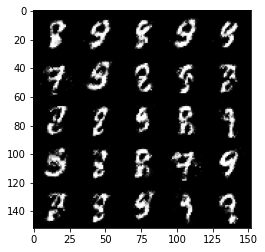

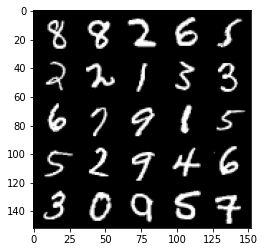

Step 44000: Generator loss: 2.1165318300724025, discriminator loss: 0.31288611349463485


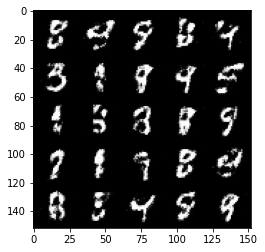

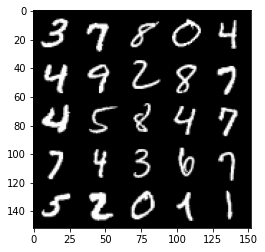

Step 44500: Generator loss: 2.1579581298828114, discriminator loss: 0.30418778422474835


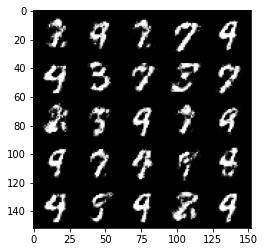

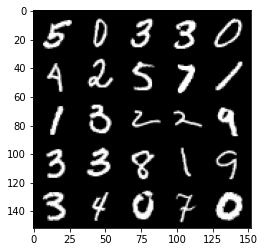

Step 45000: Generator loss: 1.9702451505661005, discriminator loss: 0.33497968131303757


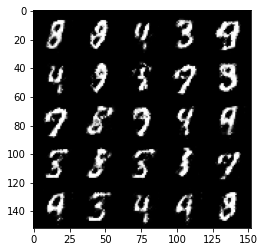

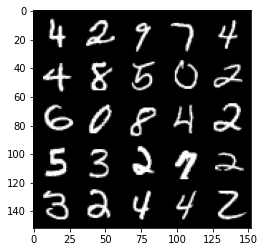

Step 45500: Generator loss: 2.126263761997221, discriminator loss: 0.29582637524604777


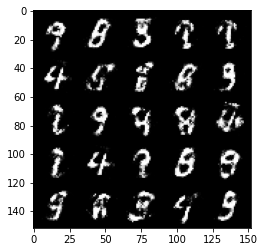

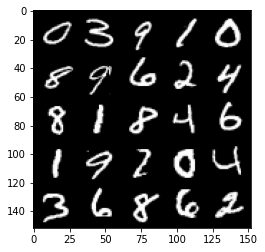

Step 46000: Generator loss: 2.160637912511824, discriminator loss: 0.2847785906195642


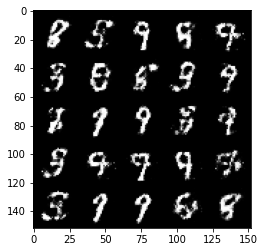

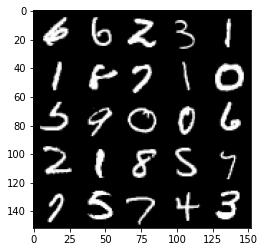

Step 46500: Generator loss: 2.227111612558364, discriminator loss: 0.2947911593317987


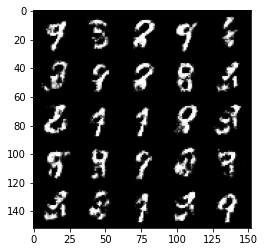

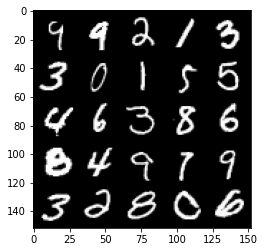

Step 47000: Generator loss: 2.1202042737007147, discriminator loss: 0.2941212079823019


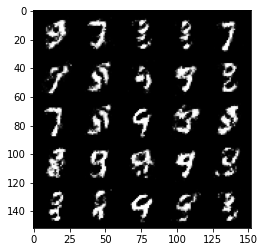

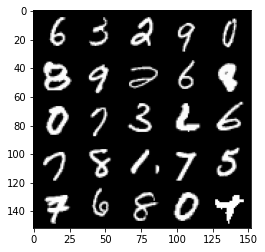

Step 47500: Generator loss: 2.13869087433815, discriminator loss: 0.2949179787933829


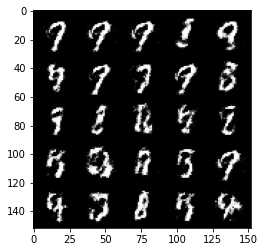

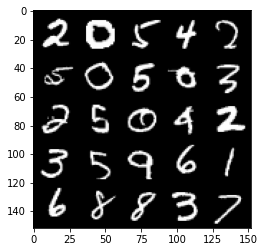

Step 48000: Generator loss: 2.188727550983428, discriminator loss: 0.2767649602890014


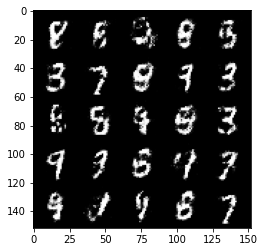

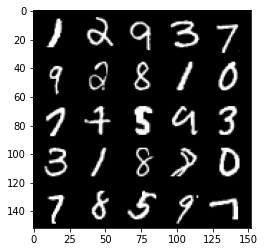

Step 48500: Generator loss: 2.1562887942791, discriminator loss: 0.28595261159539226


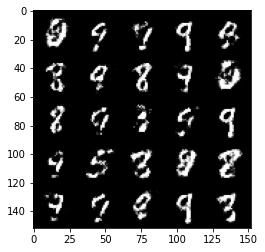

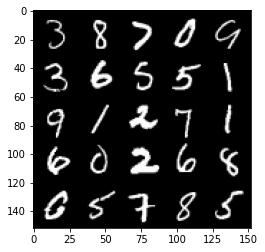

Step 49000: Generator loss: 2.080268312692643, discriminator loss: 0.30378094533085814


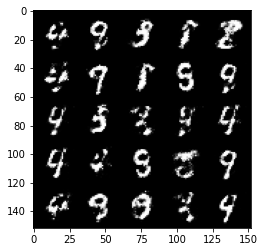

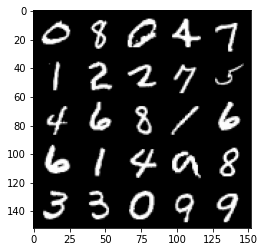

Step 49500: Generator loss: 2.1067665195465084, discriminator loss: 0.3204673081040385


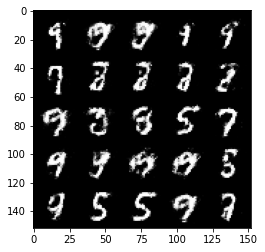

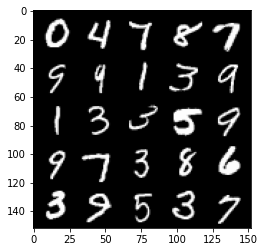

Step 50000: Generator loss: 2.062608720064164, discriminator loss: 0.307802033185959


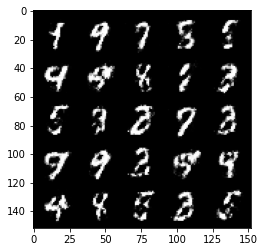

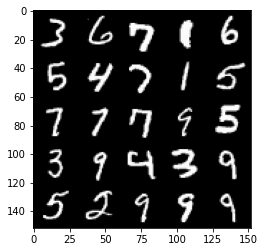

Step 50500: Generator loss: 1.9658912816047664, discriminator loss: 0.3329131371974947


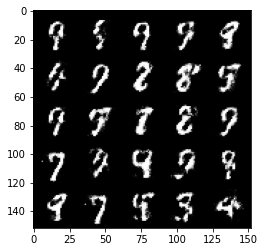

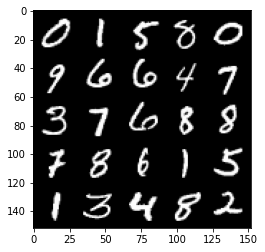

Step 51000: Generator loss: 1.969394566297531, discriminator loss: 0.3242413634061811


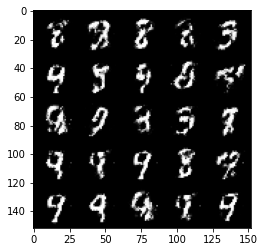

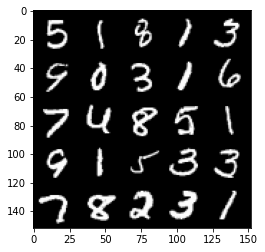

Step 51500: Generator loss: 1.9760860805511462, discriminator loss: 0.321569121807814


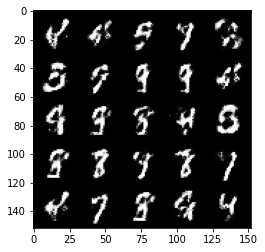

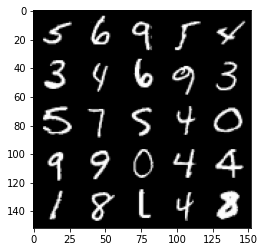

KeyboardInterrupt: 

In [33]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don't get any runtime error, it means that your code works. We check that the weights are changing in each iteration within the function.

**Congratulations, you have trained your first GAN**